In [3]:
import tensorflow as tf

load_img = tf.keras.preprocessing.image.load_img
img_to_array = tf.keras.preprocessing.image.img_to_array
array_to_img = tf.keras.preprocessing.image.array_to_img
Adam = tf.keras.optimizers.Adam
fashion_mnist = tf.keras.datasets.fashion_mnist
to_categorical = tf.keras.utils.to_categorical
ImageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator
ModelCheckpoint = tf.keras.callbacks.ModelCheckpoint
load_model = tf.keras.models.load_model

from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

import plotly.graph_objs as go
from plotly import subplots
import plotly

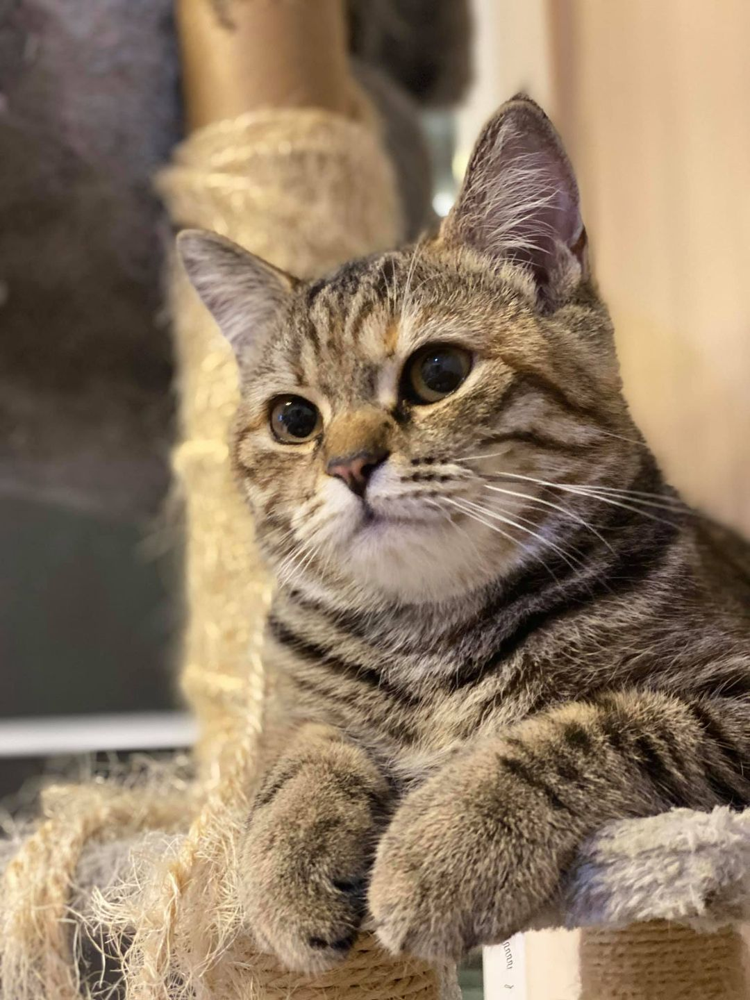

In [4]:
cat =load_img('cat.jpg')
cat

In [5]:
cat = img_to_array(cat)
print(cat.shape)

(1440, 1080, 3)


In [6]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv2D(3,      # number of filter alyers
                               (3,                      # y dimention of kernal
                                3),                     # x dimention of kernal
                                input_shape=cat.shape))
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 1438, 1078, 3)       │              84 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 84 (336.00 B)

 Trainable params: 84 (336.00 B)

 Non-trainable params: 0 (0.00 B)

In [7]:
cat_batch = np.expand_dims(cat,axis=0)
cat_batch.shape

(1, 1440, 1080, 3)

In [8]:
conv_cat = model(cat_batch)
conv_cat.shape

TensorShape([1, 1438, 1078, 3])

In [9]:
conv_cat = np.squeeze(conv_cat, axis=0)
conv_cat.shape

(1438, 1078, 3)

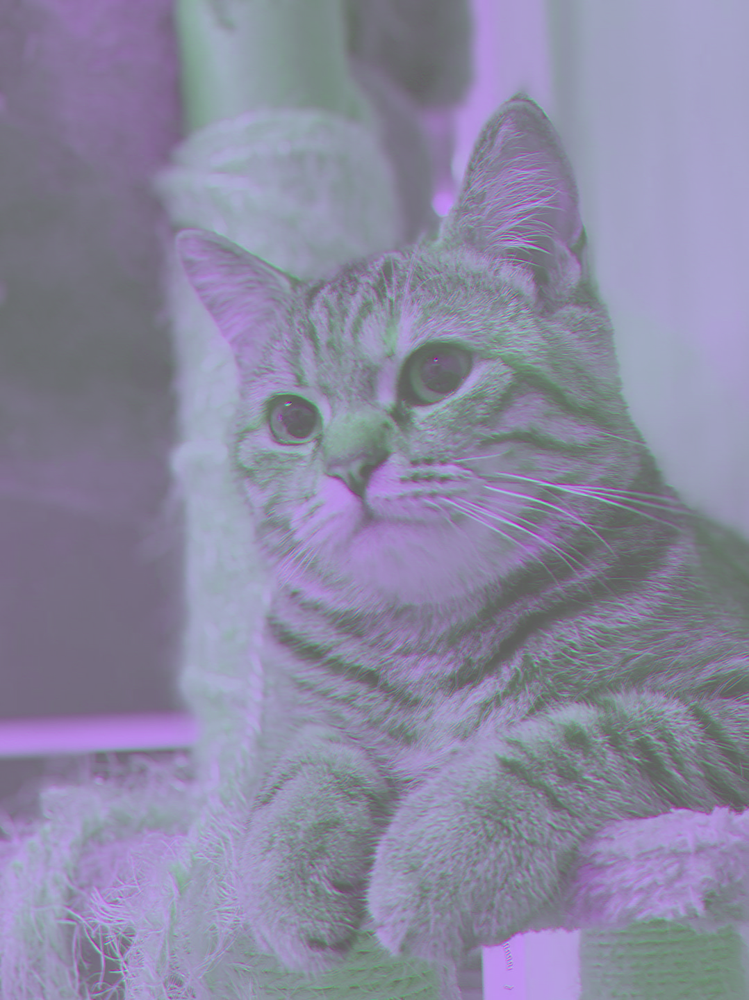

In [10]:
conv_cat = array_to_img(conv_cat)
display(conv_cat)

In [11]:
def visualize_cat(model, cat):
  cat_batch = np.expand_dims(cat, axis=0)
  conv_cat = model(cat_batch)
  conv_cat = np.squeeze(conv_cat, axis=0)
  conv_cat = array_to_img(conv_cat)
  display(conv_cat)

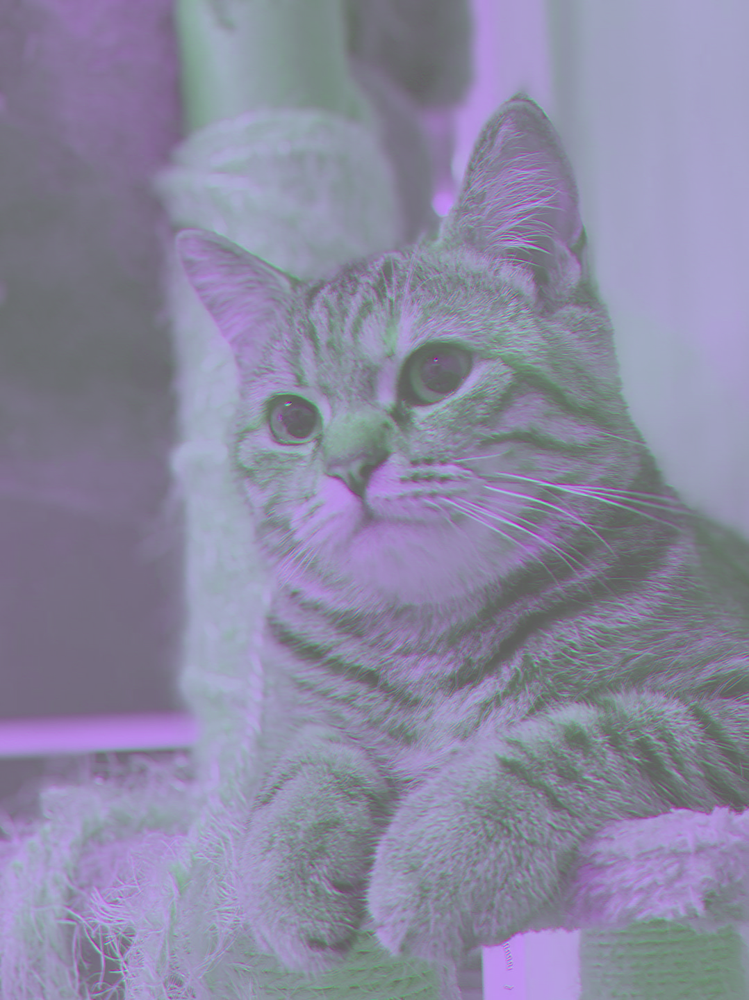

In [12]:
visualize_cat(model, cat)

In [13]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv2D(3, (10,10), input_shape=cat.shape))
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)                    │ (None, 1431, 1071, 3)       │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 903 (3.53 KB)

 Trainable params: 903 (3.53 KB)

 Non-trainable params: 0 (0.00 B)

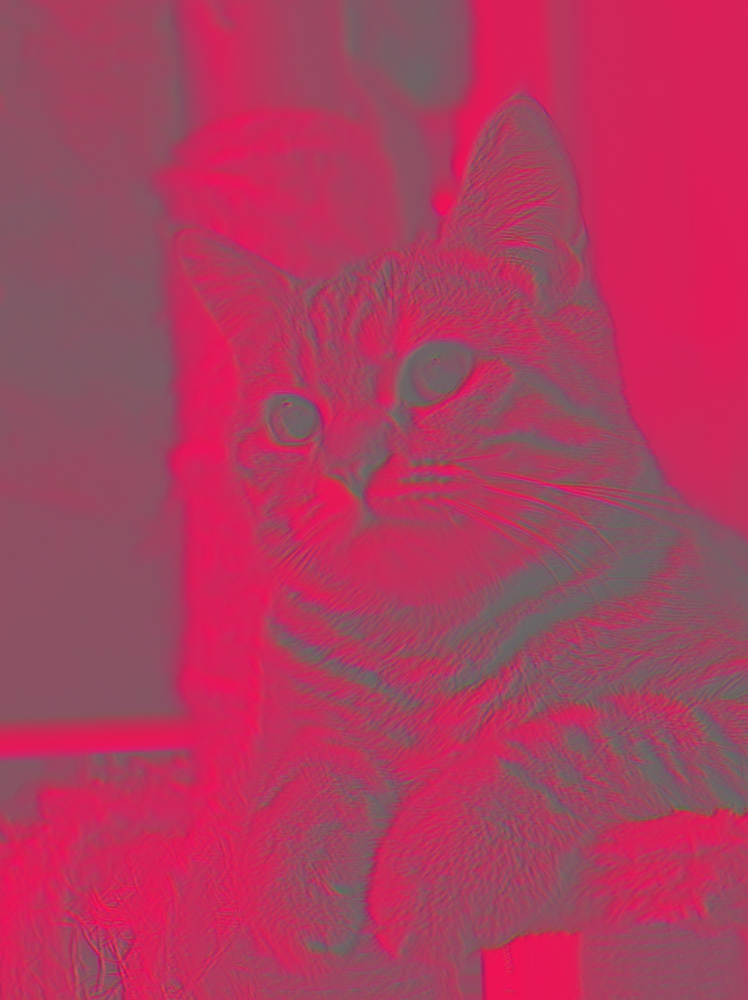

In [14]:
visualize_cat(model,cat)

In [15]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv2D(1, (3,3), input_shape=cat.shape))
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 1438, 1078, 1)       │              28 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28 (112.00 B)

 Trainable params: 28 (112.00 B)

 Non-trainable params: 0 (0.00 B)

In [16]:
def visualize_cat_one_channel(model, cat):
  cat_batch = np.expand_dims(cat, axis=0)
  conv_cat2 = model(cat_batch)
  conv_cat2 = np.squeeze(conv_cat2, axis=0)
  conv_cat2 = array_to_img(conv_cat2)
  display(conv_cat2)

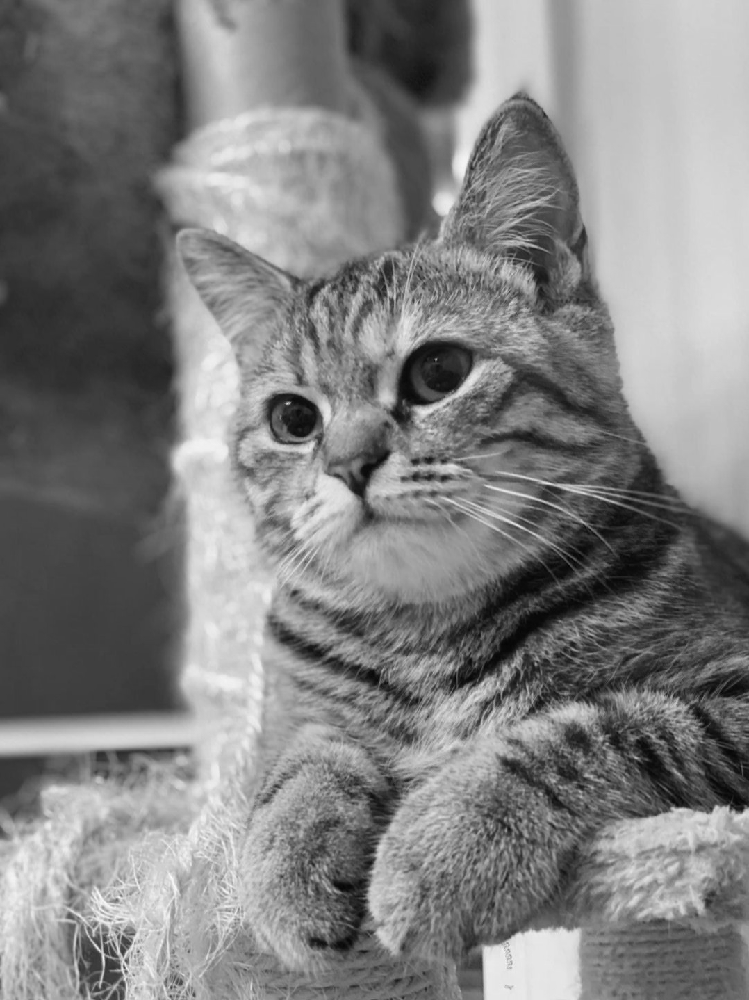

In [17]:
visualize_cat_one_channel(model, cat)

In [18]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv2D(1, (20,20), input_shape=cat.shape))
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 1421, 1061, 1)       │           1,201 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,201 (4.69 KB)

 Trainable params: 1,201 (4.69 KB)

 Non-trainable params: 0 (0.00 B)

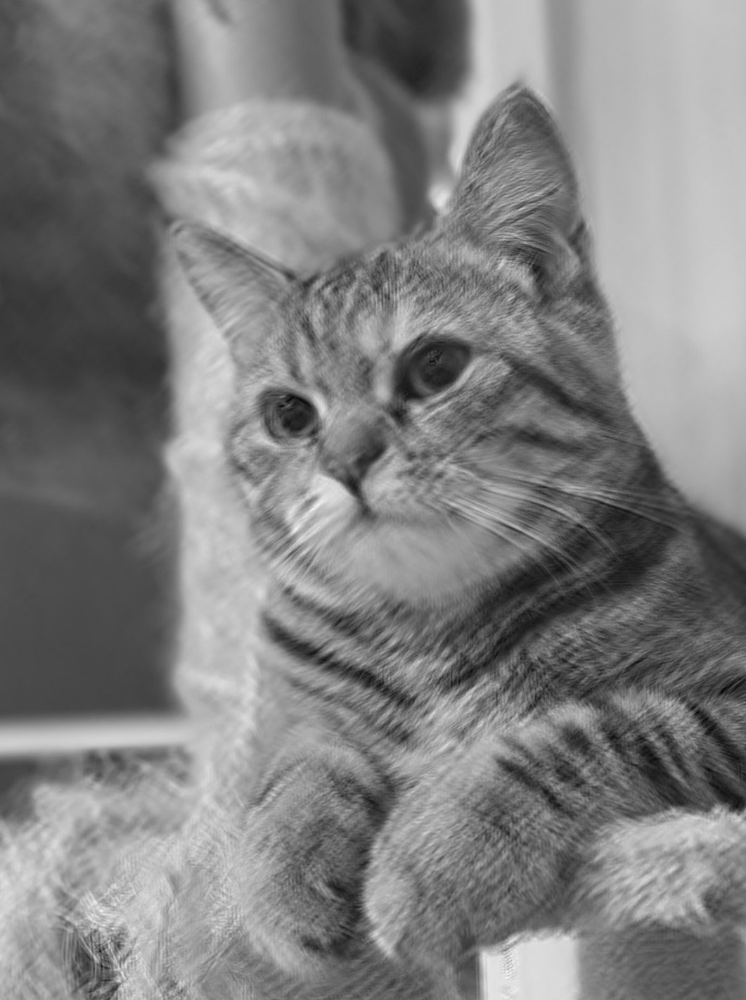

In [19]:
visualize_cat_one_channel(model, cat)

In [20]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv2D(1, (20,20), input_shape=cat.shape))
model.add(tf.keras.layers.Activation('relu'))
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 1421, 1061, 1)       │           1,201 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 1421, 1061, 1)       │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,201 (4.69 KB)

 Trainable params: 1,201 (4.69 KB)

 Non-trainable params: 0 (0.00 B)

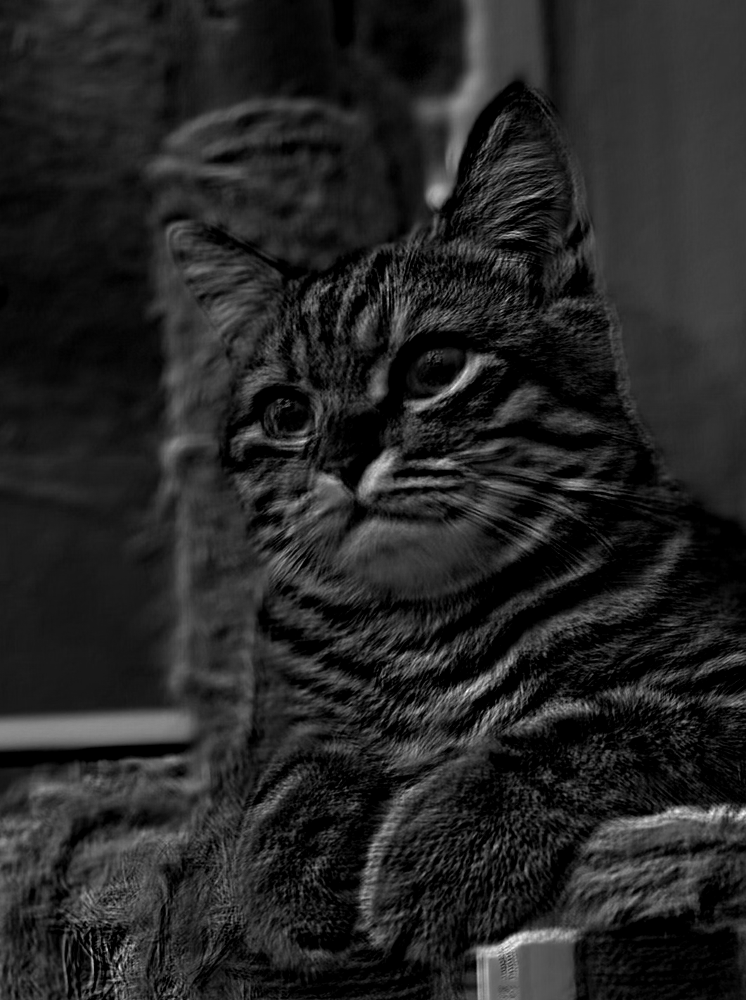

In [21]:
visualize_cat_one_channel(model, cat)

In [22]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv2D(1, (3,3), input_shape=cat.shape))
model.add(tf.keras.layers.MaxPool2D(pool_size=(5,5)))
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                    │ (None, 1438, 1078, 1)       │              28 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 287, 215, 1)         │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28 (112.00 B)

 Trainable params: 28 (112.00 B)

 Non-trainable params: 0 (0.00 B)

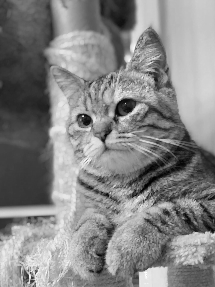

In [23]:
visualize_cat_one_channel(model, cat)

In [24]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv2D(1,(3,3), input_shape=cat.shape))
model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.MaxPool2D(pool_size=(5,5)))
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 1438, 1078, 1)       │              28 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 1438, 1078, 1)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 287, 215, 1)         │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28 (112.00 B)

 Trainable params: 28 (112.00 B)

 Non-trainable params: 0 (0.00 B)

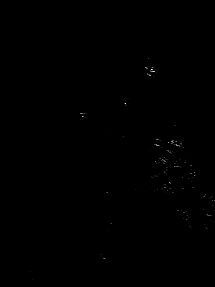

In [25]:
visualize_cat_one_channel(model, cat)

In [26]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Conv2D(1, (3,3), input_shape=cat.shape))

model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.MaxPool2D(pool_size=(3,3)))

model.add(tf.keras.layers.Conv2D(1, (3,3)))

model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.MaxPool2D(pool_size=(3,3)))

model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_7 (Conv2D)                    │ (None, 1438, 1078, 1)       │              28 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 1438, 1078, 1)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 479, 359, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 477, 357, 1)         │              10 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 477, 357, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 159, 119, 1)         │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 38 (152.00 B)

 Trainable params: 38 (152.00 B)

 Non-trainable params: 0 (0.00 B)

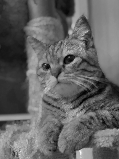

In [27]:
visualize_cat_one_channel(model, cat)

In [28]:
IMG_ROWS = 28
IMG_COLS = 28
NUM_CLASSES = 10
VAL_SIZE = 0.2
RANDOM_STATE = 99
BATCH_SIZE = 128

In [29]:
(train_data,y),(test_data,y_test) = fashion_mnist.load_data()

print("Fashion MNIST train - rows:",train_data.shape[0]," columns:",train_data.shape[1]," rows:",train_data.shape[2])
print("Fashion MNIST test - rows:",test_data.shape[0]," columns:",test_data.shape[1]," rows:",test_data.shape[2])

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Fashion MNIST train - rows: 60000  columns: 28  rows: 28
Fashion MNIST test - rows: 10000  columns: 28  rows: 28


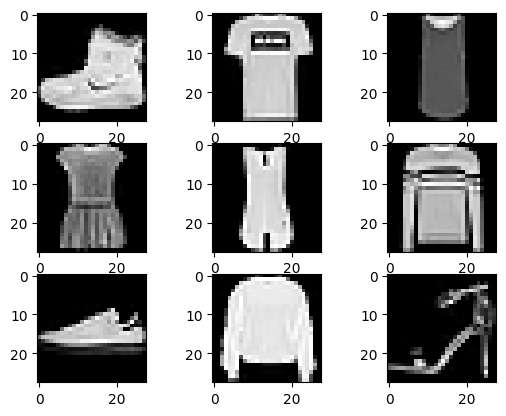

In [30]:
for i in range(9):
  plt.subplot(330+1+i)
  plt.imshow(train_data[i], cmap='gray')

plt.savefig('fashion_mnist.jpeg', dpi=300)

In [31]:
print(train_data.shape,test_data.shape)

train_data = train_data.reshape(train_data.shape[0],IMG_ROWS,IMG_COLS,1)
test_data = test_data.reshape(test_data.shape[0],IMG_ROWS,IMG_COLS,1)

print(train_data.shape,test_data.shape)

(60000, 28, 28) (10000, 28, 28)
(60000, 28, 28, 1) (10000, 28, 28, 1)


In [32]:
train_data = train_data/255.0
test_data = test_data/255.0

In [33]:
y = to_categorical(y)
y_test = to_categorical(y_test)

print(y.shape,y_test.shape)
y[:10]

(60000, 10) (10000, 10)


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]])

In [34]:
x_train,x_val,y_train,y_val = train_test_split(train_data,y,test_size=VAL_SIZE,random_state=RANDOM_STATE)

print(x_train.shape,x_val.shape,y_train.shape,y_val.shape)

(48000, 28, 28, 1) (12000, 28, 28, 1) (48000, 10) (12000, 10)


In [35]:
def create_trace(x,y,ylabel,color):
  trace = go.Scatter(
      x = x,y = y,
      name=ylabel,
      marker=dict(color=color),
      mode="markers+lines",
      text=x
  )
  return trace

def plot_accuracy_and_loss(train_model):
  hist = train_model.history
  acc = hist['accuracy']
  val_acc = hist['val_accuracy']
  loss = hist['loss']
  val_loss = hist['val_loss']
  epochs = list(range(1,len(acc)+1))

  trace_ta = create_trace(epochs,acc,"Training Accuracy","Green")
  trace_va = create_trace(epochs,val_acc,"Validation Accuracy","Red")
  trace_tl = create_trace(epochs,loss,"Training Loss","Blue")
  trace_vl = create_trace(epochs,val_loss,"Validation Loss","Magenta")
  fig = subplots.make_subplots(rows=1,cols=2,subplot_titles=("Training and validation accuracy","Training and validation loss"))
  fig.append_trace(trace_ta,1,1)
  fig.append_trace(trace_va,1,1)
  fig.append_trace(trace_tl,1,2)
  fig.append_trace(trace_vl,1,2)
  fig['layout']['xaxis'].update(title='Epoch')
  fig['layout']['xaxis2'].update(title='Epoch')
  fig['layout']['yaxis'].update(title='Accuracy',range=[0,1])
  fig['layout']['yaxis2'].update(title='Loss',range=[0,2])

  plotly.offline.iplot(fig, filename='accuracy-loss')

In [36]:
datagen = ImageDataGenerator(
    rotation_range=0.05,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
)
datagen.fit(x_train)

In [37]:
model = tf.keras.Sequential()

#1.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=32, kernel_size=(3,3), padding='same',input_shape=(IMG_ROWS,IMG_COLS,1),name='conv2d1'))
model.add(tf.keras.layers.BatchNormalization(name = 'batchnorm1'))
model.add(tf.keras.layers.Activation('relu',name='relu1'))
model.add(tf.keras.layers.Dropout(0.3,name='dropout1'))

#2.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=32, kernel_size=(3,3), padding='same',name='conv2d2'))
model.add(tf.keras.layers.BatchNormalization(name = 'batchnorm2'))
model.add(tf.keras.layers.Activation('relu',name='relu2'))

model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2),name='maxpool2d1'))
model.add(tf.keras.layers.Dropout(0.3,name='dropout2'))

#3.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3), padding='same',name='conv2d3'))
model.add(tf.keras.layers.BatchNormalization(name = 'batchnorm3'))
model.add(tf.keras.layers.Activation('relu',name='relu3'))
model.add(tf.keras.layers.Dropout(0.3,name='dropout3'))

#4.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3), padding='same',name='conv2d4'))
model.add(tf.keras.layers.BatchNormalization(name = 'batchnorm4'))
model.add(tf.keras.layers.Activation('relu',name='relu4'))

model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2),name='maxpool2d2'))
model.add(tf.keras.layers.Dropout(0.3,name='dropout4'))

#FULLY CONNECTED LAYER
model.add(tf.keras.layers.Flatten(name='flatten1'))
model.add(tf.keras.layers.Dense(256,name='dense1'))
model.add(tf.keras.layers.BatchNormalization(name = 'batchnorm5'))
model.add(tf.keras.layers.Activation('relu',name='relu5'))
model.add(tf.keras.layers.Dropout(0.5,name='dropout5'))

#OUTPUT LAYER
model.add(tf.keras.layers.Dense(NUM_CLASSES,activation='softmax',name='dense2'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [38]:
optimizer = Adam()
model.compile(optimizer=optimizer,loss='categorical_crossentropy',metrics=['accuracy'])

In [39]:
filepath="weight.best.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [checkpoint]

In [40]:
NO_EPOCHS = 30
history = model.fit(datagen.flow(x_train,y_train,batch_size=BATCH_SIZE),
                              shuffle=True,
                              epochs=NO_EPOCHS,validation_data=(x_val,y_val),
                              verbose=1,steps_per_epoch=x_train.shape[0] // BATCH_SIZE,
                              callbacks=callbacks_list)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 703ms/step - accuracy: 0.6085 - loss: 1.1020
Epoch 1: val_loss improved from inf to 2.37859, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 286s 740ms/step - accuracy: 0.6088 - loss: 1.1013 - val_accuracy: 0.2807 - val_loss: 2.3786
Epoch 2/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 685ms/step - accuracy: 0.7730 - loss: 0.5969
Epoch 2: val_loss improved from 2.37859 to 0.42549, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 271s 722ms/step - accuracy: 0.7731 - loss: 0.5968 - val_accuracy: 0.8500 - val_loss: 0.4255
Epoch 3/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 665ms/step - accuracy: 0.8049 - loss: 0.5175
Epoch 3: val_loss improved from 0.42549 to 0.38590, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 270s 720ms/step - accuracy: 0.8049 - loss: 0.5175 - val_accuracy: 0.8512 - val_loss: 0.3859
Epoch 4/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 665ms/step - accuracy: 0.8242 - loss: 0.4718
Epoch 4: val_loss improved from 0.38590 to 0.31291, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 270s 720ms/step - accuracy: 0.8242 - loss: 0.4718 - val_accuracy: 0.8837 - val_loss: 0.3129
Epoch 5/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 671ms/step - accuracy: 0.8324 - loss: 0.4443
Epoch 5: val_loss improved from 0.31291 to 0.30917, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 324s 726ms/step - accuracy: 0.8324 - loss: 0.4443 - val_accuracy: 0.8835 - val_loss: 0.3092
Epoch 6/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 668ms/step - accuracy: 0.8442 - loss: 0.4223
Epoch 6: val_loss did not improve from 0.30917
375/375 ━━━━━━━━━━━━━━━━━━━━ 314s 705ms/step - accuracy: 0.8442 - loss: 0.4223 - val_accuracy: 0.8775 - val_loss: 0.3333
Epoch 7/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 664ms/step - accuracy: 0.8497 - loss: 0.3980
Epoch 7: val_loss improved from 0.30917 to 0.27991, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 270s 720ms/step - accuracy: 0.8497 - loss: 0.3980 - val_accuracy: 0.8957 - val_loss: 0.2799
Epoch 8/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 667ms/step - accuracy: 0.8550 - loss: 0.3903
Epoch 8: val_loss improved from 0.27991 to 0.27450, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 264s 704ms/step - accuracy: 0.8550 - loss: 0.3903 - val_accuracy: 0.8991 - val_loss: 0.2745
Epoch 9/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 669ms/step - accuracy: 0.8611 - loss: 0.3772
Epoch 9: val_loss improved from 0.27450 to 0.27098, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 329s 724ms/step - accuracy: 0.8611 - loss: 0.3772 - val_accuracy: 0.8989 - val_loss: 0.2710
Epoch 10/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 666ms/step - accuracy: 0.8617 - loss: 0.3713
Epoch 10: val_loss improved from 0.27098 to 0.26601, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 314s 703ms/step - accuracy: 0.8617 - loss: 0.3712 - val_accuracy: 0.8988 - val_loss: 0.2660
Epoch 11/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 667ms/step - accuracy: 0.8659 - loss: 0.3597
Epoch 11: val_loss improved from 0.26601 to 0.25749, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 264s 704ms/step - accuracy: 0.8659 - loss: 0.3597 - val_accuracy: 0.9031 - val_loss: 0.2575
Epoch 12/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 667ms/step - accuracy: 0.8672 - loss: 0.3571
Epoch 12: val_loss improved from 0.25749 to 0.25136, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 264s 704ms/step - accuracy: 0.8672 - loss: 0.3571 - val_accuracy: 0.9064 - val_loss: 0.2514
Epoch 13/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 667ms/step - accuracy: 0.8730 - loss: 0.3399
Epoch 13: val_loss improved from 0.25136 to 0.23992, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 322s 703ms/step - accuracy: 0.8730 - loss: 0.3399 - val_accuracy: 0.9100 - val_loss: 0.2399
Epoch 14/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 666ms/step - accuracy: 0.8758 - loss: 0.3376
Epoch 14: val_loss did not improve from 0.23992
375/375 ━━━━━━━━━━━━━━━━━━━━ 322s 703ms/step - accuracy: 0.8758 - loss: 0.3376 - val_accuracy: 0.9091 - val_loss: 0.2437
Epoch 15/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 662ms/step - accuracy: 0.8771 - loss: 0.3299
Epoch 15: val_loss did not improve from 0.23992
375/375 ━━━━━━━━━━━━━━━━━━━━ 262s 699ms/step - accuracy: 0.8771 - loss: 0.3299 - val_accuracy: 0.9101 - val_loss: 0.2417
Epoch 16/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 662ms/step - accuracy: 0.8803 - loss: 0.3256
Epoch 16: val_loss improved from 0.23992 to 0.23608, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 262s 699ms/step - accuracy: 0.8803 - loss: 0.3257 - val_accuracy: 0.9091 - val_loss: 0.2361
Epoch 17/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 662ms/step - accuracy: 0.8836 - loss: 0.3151
Epoch 17: val_loss improved from 0.23608 to 0.21587, saving model to weight.best.h5


375/375 ━━━━━━━━━━━━━━━━━━━━ 322s 700ms/step - accuracy: 0.8836 - loss: 0.3151 - val_accuracy: 0.9201 - val_loss: 0.2159
Epoch 18/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 669ms/step - accuracy: 0.8841 - loss: 0.3162
Epoch 18: val_loss did not improve from 0.21587
375/375 ━━━━━━━━━━━━━━━━━━━━ 271s 724ms/step - accuracy: 0.8841 - loss: 0.3162 - val_accuracy: 0.9099 - val_loss: 0.2392
Epoch 19/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 668ms/step - accuracy: 0.8814 - loss: 0.3196
Epoch 19: val_loss did not improve from 0.21587
375/375 ━━━━━━━━━━━━━━━━━━━━ 264s 705ms/step - accuracy: 0.8814 - loss: 0.3196 - val_accuracy: 0.9178 - val_loss: 0.2273
Epoch 20/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 668ms/step - accuracy: 0.8844 - loss: 0.3121
Epoch 20: val_loss did not improve from 0.21587
375/375 ━━━━━━━━━━━━━━━━━━━━ 271s 723ms/step - accuracy: 0.8844 - loss: 0.3122 - val_accuracy: 0.9195 - val_loss: 0.2178
Epoch 21/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 663ms/step - accuracy: 0.8846 - loss: 0.3124
Epoch 21: val_lo

375/375 ━━━━━━━━━━━━━━━━━━━━ 291s 731ms/step - accuracy: 0.8893 - loss: 0.2966 - val_accuracy: 0.9241 - val_loss: 0.2045
Epoch 26/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 692ms/step - accuracy: 0.8931 - loss: 0.2867
Epoch 26: val_loss did not improve from 0.20453
375/375 ━━━━━━━━━━━━━━━━━━━━ 280s 747ms/step - accuracy: 0.8931 - loss: 0.2867 - val_accuracy: 0.9224 - val_loss: 0.2084
Epoch 27/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 662ms/step - accuracy: 0.8935 - loss: 0.2909
Epoch 27: val_loss did not improve from 0.20453
375/375 ━━━━━━━━━━━━━━━━━━━━ 269s 717ms/step - accuracy: 0.8935 - loss: 0.2909 - val_accuracy: 0.9226 - val_loss: 0.2097
Epoch 28/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 662ms/step - accuracy: 0.8895 - loss: 0.2945
Epoch 28: val_loss did not improve from 0.20453
375/375 ━━━━━━━━━━━━━━━━━━━━ 322s 716ms/step - accuracy: 0.8895 - loss: 0.2945 - val_accuracy: 0.9227 - val_loss: 0.2103
Epoch 29/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 661ms/step - accuracy: 0.8937 - loss: 0.2916
Epoch 29: val_lo

In [41]:
plot_accuracy_and_loss(history)

In [44]:
predict_model = load_model("/content/weight.best.h5")

In [45]:
score = predict_model.evaluate(test_data, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.21441777050495148
Test accuracy: 0.9211000204086304


In [46]:
predict_model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d1 (Conv2D)                     │ (None, 28, 28, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batchnorm1 (BatchNormalization)      │ (None, 28, 28, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu1 (Activation)                   │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout1 (Dropout)                   │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d2 (Conv2D)                     │ (None, 28, 28, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batchnorm2 (BatchNormalization)      │ (None, 28, 28, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu2 (Activation)                   │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ maxpool2d1 (MaxPooling2D)            │ (None, 14, 14, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout2 (Dropout)                   │ (None, 14, 14, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d3 (Conv2D)                     │ (None, 14, 14, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batchnorm3 (BatchNormalization)      │ (None, 14, 14, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu3 (Activation)                   │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout3 (Dropout)                   │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d4 (Conv2D)                     │ (None, 14, 14, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batchnorm4 (BatchNormalization)      │ (None, 14, 14, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu4 (Activation)                   │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ maxpool2d2 (MaxPooling2D)            │ (None, 7, 7, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout4 (Dropout)                   │ (None, 7, 7, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten1 (Flatten)                   │ (None, 3136)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense1 (Dense)                       │ (None, 256)                 │         803,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batchnorm5 (BatchNormalization)      │ (None, 256)                 │           1,024 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 872,428 (3.33 MB)

 Trainable params: 871,530 (3.32 MB)

 Non-trainable params: 896 (3.50 KB)

 Optimizer params: 2 (12.00 B)

In [47]:
kernel_bias = []
for layer in predict_model.layers:
  if 'conv' not in layer.name:
    continue
  kernels, biases = layer.get_weights()
  kernel_bias.append([kernels, biases])
  print(layer.name,kernels.shape)

conv2d1 (3, 3, 1, 32)
conv2d2 (3, 3, 32, 32)
conv2d3 (3, 3, 32, 64)
conv2d4 (3, 3, 64, 64)


In [48]:
kernels, biases = kernel_bias[0]

kernels.shape, biases.shape

((3, 3, 1, 32), (32,))

In [49]:
k_min, k_max = kernels.min(), kernels.max()
kernels = (kernels - k_min)/(k_max - k_min)

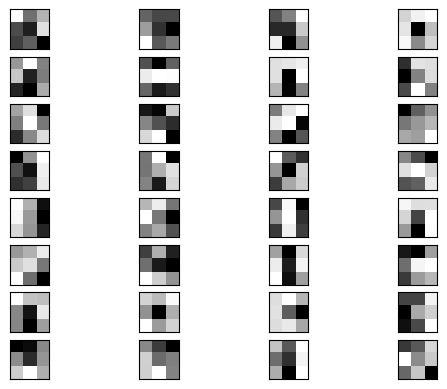

In [50]:
n_kwenels, ix=32, 1
for i in range(n_kwenels):
  f = kernels[:, :, :, i]
  for j in range(1):
    ax = plt.subplot(8, 4, ix)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.imshow(f[:, :, j], cmap='gray')
    ix += 1
plt.savefig('filter.jpeg', dpi=200)

In [53]:
model = tf.keras.models.Model(inputs=predict_model.inputs, outputs=predict_model.layers[0].output)
model.summary()

Model: "functional_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)           │ (None, 28, 28, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d1 (Conv2D)                     │ (None, 28, 28, 32)          │             320 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 320 (1.25 KB)

 Trainable params: 320 (1.25 KB)

 Non-trainable params: 0 (0.00 B)

In [55]:
img = x_train[10:11]

In [56]:
feature_maps = model(img)

feature_maps.shape

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning:

The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_8']
Received: inputs=Tensor(shape=(1, 28, 28, 1))



TensorShape([1, 28, 28, 32])

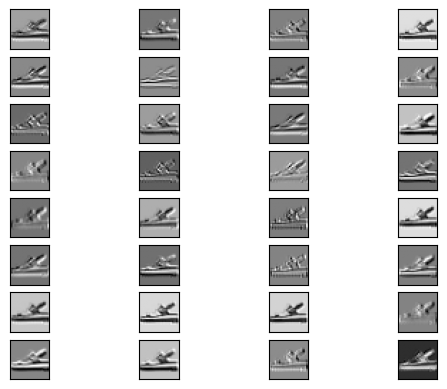

In [57]:
ix = 1
for _ in range(8):
  for _ in range(4):
    ax = plt.subplot(8, 4, ix)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
    ix += 1
plt.savefig('feature_map1.jpeg', dpi=300)

In [58]:
model = tf.keras.models.Model(inputs=predict_model.inputs, outputs=predict_model.layers[2].output)

model.summary()

Model: "functional_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)           │ (None, 28, 28, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d1 (Conv2D)                     │ (None, 28, 28, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batchnorm1 (BatchNormalization)      │ (None, 28, 28, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu1 (Activation)                   │ (None, 28, 28, 32)          │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 448 (1.75 KB)

 Trainable params: 384 (1.50 KB)

 Non-trainable params: 64 (256.00 B)

In [59]:
feature_maps = model(img)

feature_maps.shape

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning:

The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_8']
Received: inputs=Tensor(shape=(1, 28, 28, 1))



TensorShape([1, 28, 28, 32])

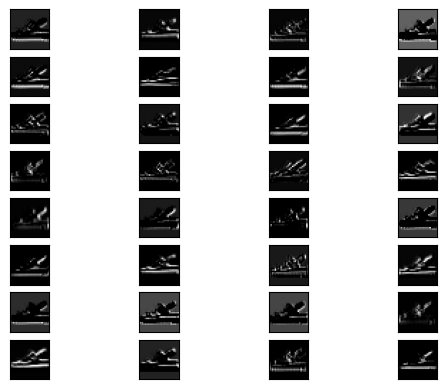

In [60]:
ix = 1
for _ in range(8):
  for _ in range(4):
    ax = plt.subplot(8, 4, ix)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
    ix += 1
plt.savefig('feature_map2.jpeg', dpi=300)

In [61]:
model = tf.keras.models.Model(inputs=predict_model.inputs, outputs=predict_model.layers[4].output)

model.summary()

Model: "functional_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)           │ (None, 28, 28, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d1 (Conv2D)                     │ (None, 28, 28, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batchnorm1 (BatchNormalization)      │ (None, 28, 28, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu1 (Activation)                   │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout1 (Dropout)                   │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d2 (Conv2D)                     │ (None, 28, 28, 32)          │           9,248 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,696 (37.88 KB)

 Trainable params: 9,632 (37.62 KB)

 Non-trainable params: 64 (256.00 B)

In [62]:
feature_maps = model(img)
feature_maps.shape

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning:

The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_8']
Received: inputs=Tensor(shape=(1, 28, 28, 1))



TensorShape([1, 28, 28, 32])

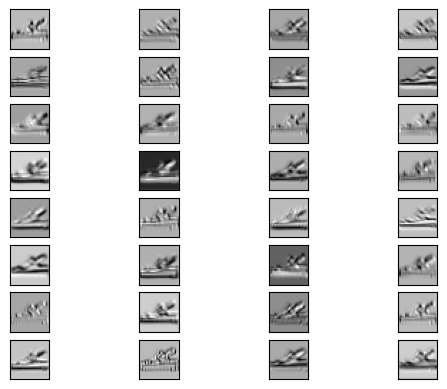

In [63]:
ix = 1
for _ in range(8):
  for _ in range(4):
    ax = plt.subplot(8, 4, ix)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
    ix += 1
plt.savefig('feature_map3.jpeg', dpi=300)

In [64]:
model = tf.keras.models.Model(inputs=predict_model.inputs, outputs=predict_model.layers[16].output)

model.summary()

Model: "functional_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)           │ (None, 28, 28, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d1 (Conv2D)                     │ (None, 28, 28, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batchnorm1 (BatchNormalization)      │ (None, 28, 28, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu1 (Activation)                   │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout1 (Dropout)                   │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d2 (Conv2D)                     │ (None, 28, 28, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batchnorm2 (BatchNormalization)      │ (None, 28, 28, 32)          │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu2 (Activation)                   │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ maxpool2d1 (MaxPooling2D)            │ (None, 14, 14, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout2 (Dropout)                   │ (None, 14, 14, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d3 (Conv2D)                     │ (None, 14, 14, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batchnorm3 (BatchNormalization)      │ (None, 14, 14, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu3 (Activation)                   │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout3 (Dropout)                   │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d4 (Conv2D)                     │ (None, 14, 14, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batchnorm4 (BatchNormalization)      │ (None, 14, 14, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ relu4 (Activation)                   │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ maxpool2d2 (MaxPooling2D)            │ (None, 7, 7, 64)            │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 65,760 (256.88 KB)

 Trainable params: 65,376 (255.38 KB)

 Non-trainable params: 384 (1.50 KB)

In [65]:
feature_maps = model(img)

feature_maps.shape

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning:

The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_8']
Received: inputs=Tensor(shape=(1, 28, 28, 1))



TensorShape([1, 7, 7, 64])

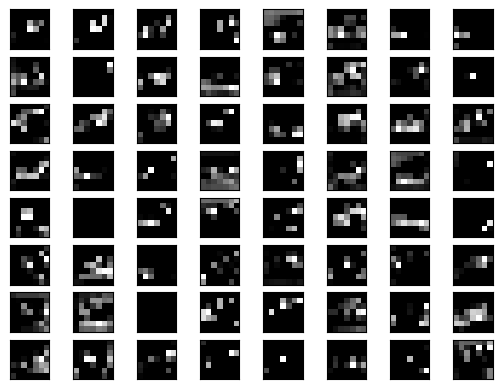

In [66]:
ix  = 1
for _ in range(8):
  for _ in range(8):
    ax = plt.subplot(8, 8, ix)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
    ix += 1
plt.savefig('feature_map4.jpeg', dpi=300)